In [1]:
from google.colab import files
uploaded = files.upload()
#uploaded = files.upload

Saving pubg-weapon-stats.csv to pubg-weapon-stats.csv


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('pubg-weapon-stats.csv')
df.head()

,Weapon Name,Weapon Type,Bullet Type,Damage,Magazine Capacity,Range,Bullet Speed,Rate of Fire,Shots to Kill (Chest),Shots to Kill (Head),...,HDMG_3,Total Body Damage,Total Head Damage,Damage per Bullet,Damage per Second,Normalized Range,Fire Mode_Single,"Fire Mode_Single, Automatic","Fire Mode_Single, Automatic, Burst","Fire Mode_Single, Burst"
0,Groza,Assault Rifle,7.62,49,30,400.0,715.0,0.080,4,2,...,51.8,132.7,316.5,1.633333,612.500000,0.428571,False,False,True,False
1,AKM,Assault Rifle,7.62,49,30,400.0,710.0,0.010,4,2,...,51.8,132.7,316.5,1.633333,4900.000000,0.428571,False,True,False,False
2,M762,Assault Rifle,7.62,47,30,400.0,715.0,0.086,4,2,...,49.7,128.2,303.6,1.566667,546.511628,0.428571,False,False,True,False
3,MK47 Mutant,Assault Rifle,7.62,49,30,500.0,715.0,0.010,4,2,...,51.8,134.7,316.5,1.633333,4900.000000,0.542857,False,False,False,True
4,AUG A3,Assault Rifle,5.56,43,30,600.0,880.0,0.086,4,2,...,45.4,116.2,277.7,1.433333,500.000000,0.657143,False,True,False,False


<Axes: xlabel='Weapon Name'>

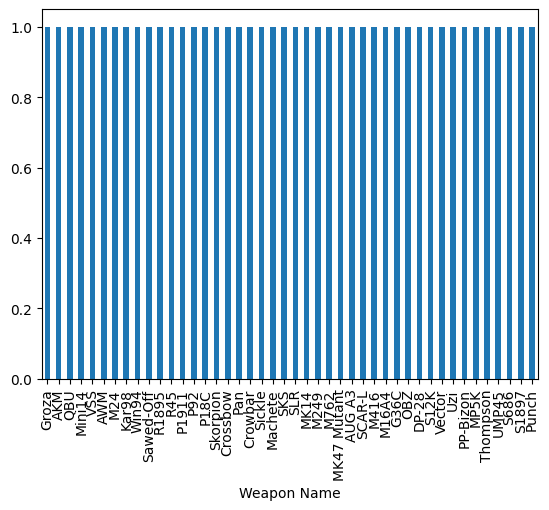

In [4]:
df['Weapon Name'].value_counts().plot(kind='bar')


<Axes: xlabel='Weapon Type'>

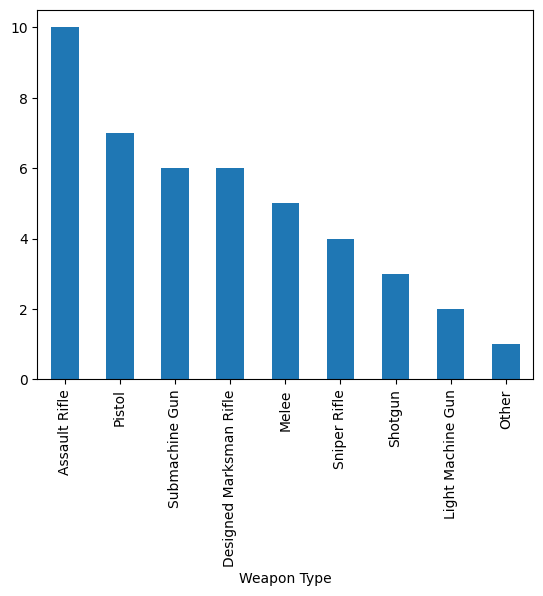

In [5]:
df['Weapon Type'].value_counts().plot(kind='bar')


<Axes: ylabel='count'>

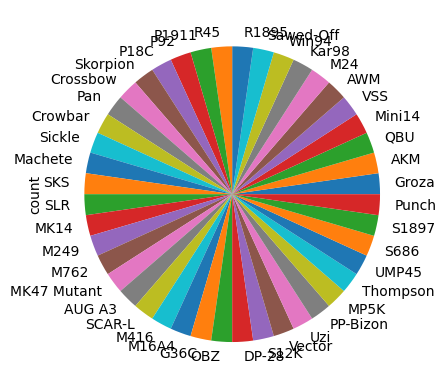

In [6]:
df['Weapon Name'].value_counts().plot(kind='pie')


<Axes: ylabel='count'>

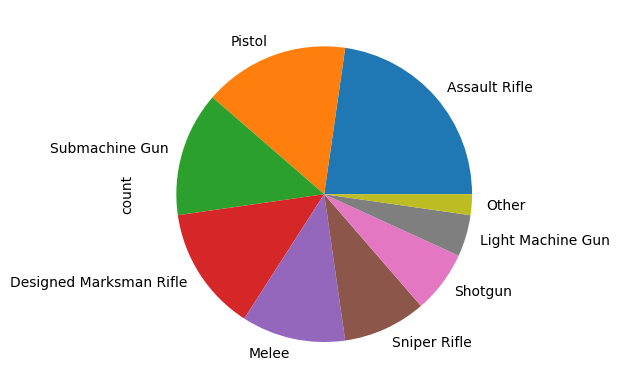

In [7]:
df['Weapon Type'].value_counts().plot(kind='pie')


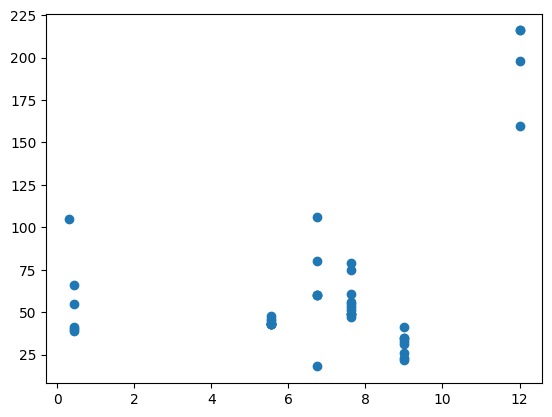

In [8]:
plt.scatter(df['Bullet Type'], df['Damage'])
plt.show()


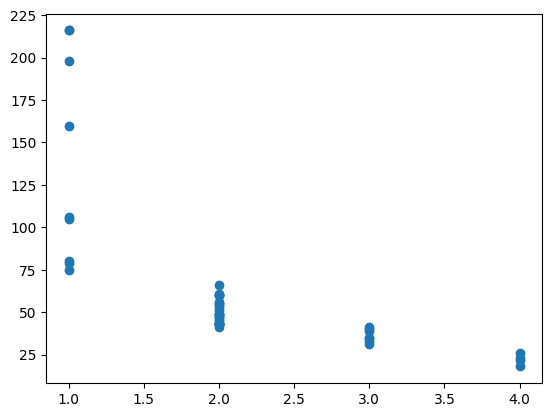

In [9]:
plt.scatter(df['Shots to Kill (Head)'], df['Damage'])
plt.show()


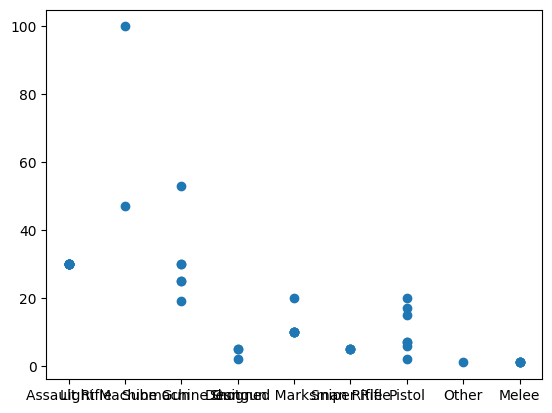

In [10]:
plt.scatter(df['Weapon Type'], df['Magazine Capacity'])
plt.show()


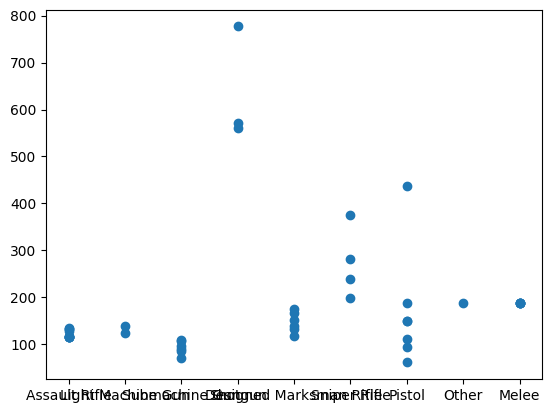

In [11]:
plt.scatter(df['Weapon Type'], df['Total Body Damage'])
plt.show()


Bullet Type


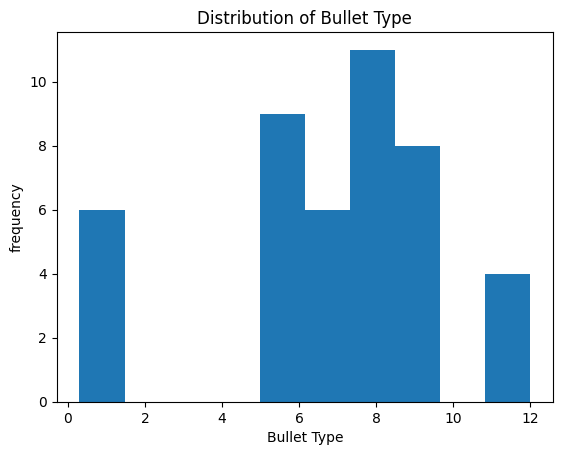

Damage


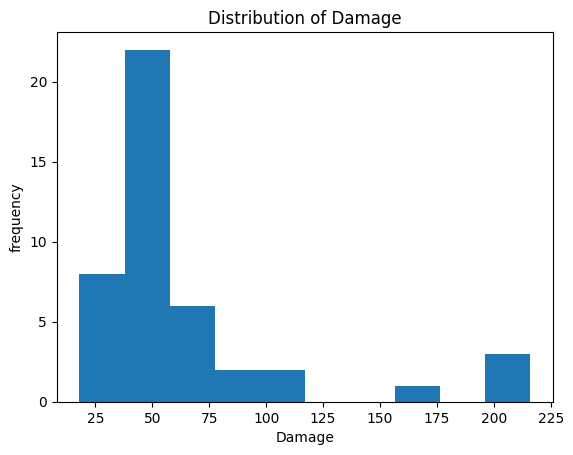

Magazine Capacity


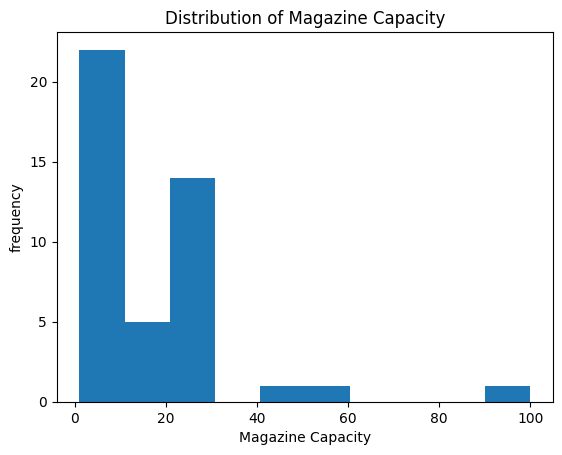

Range


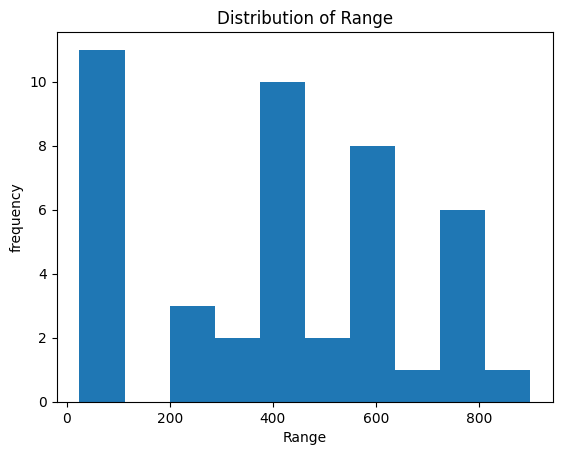

Bullet Speed


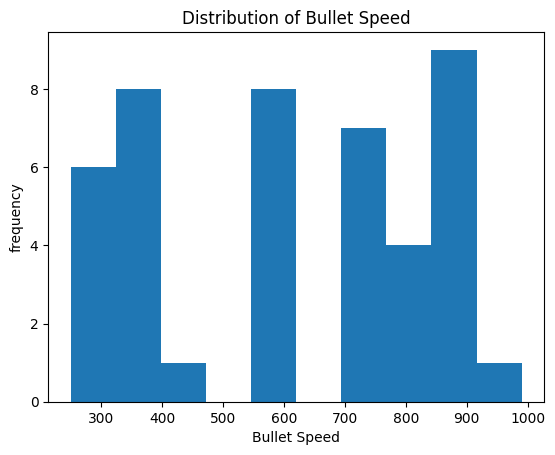

Rate of Fire


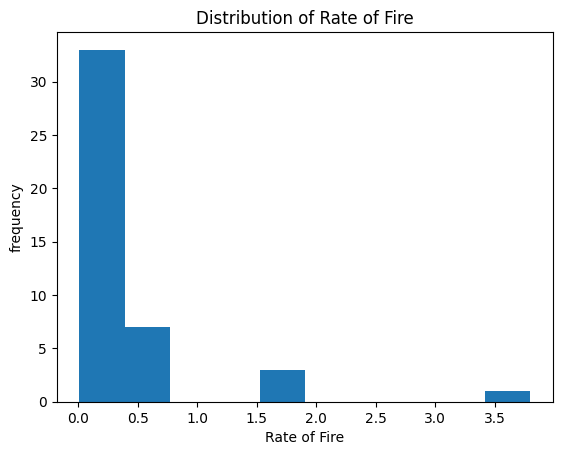

Shots to Kill (Chest)


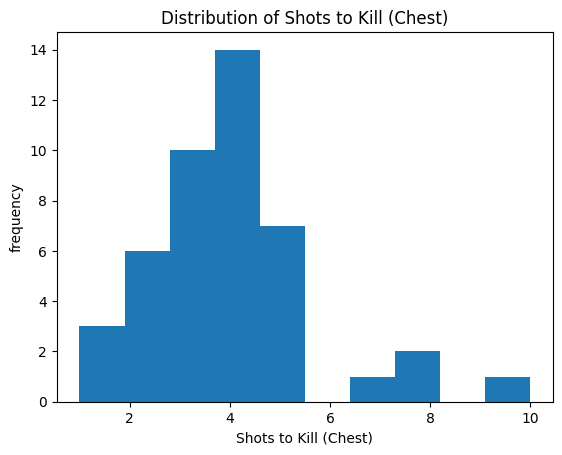

Shots to Kill (Head)


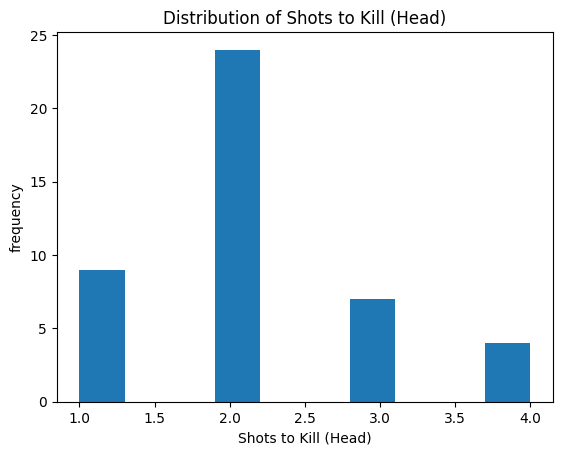

Damage Per Second


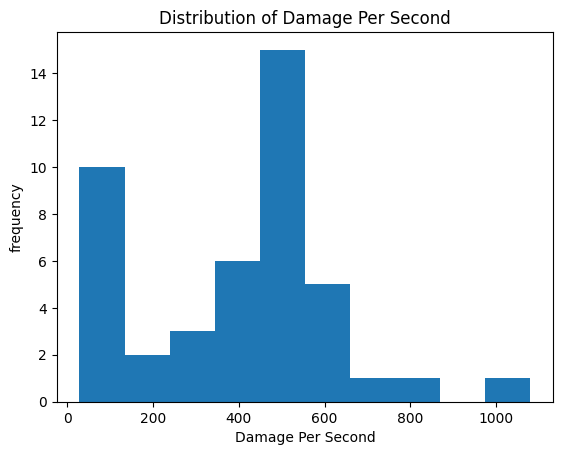

BDMG_0


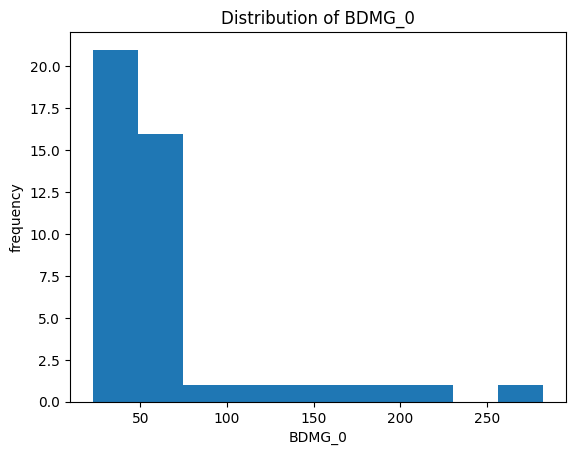

BDMG_1


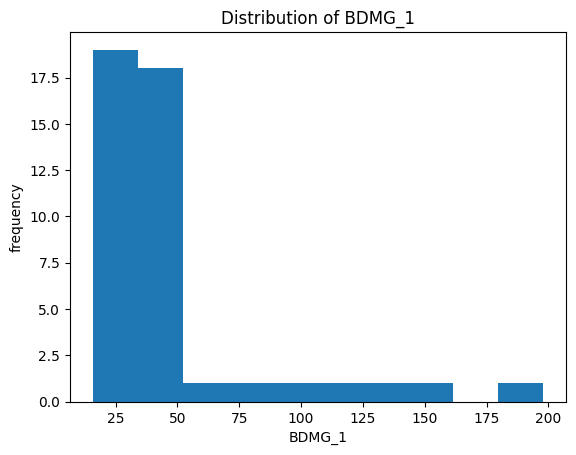

BDMG_2


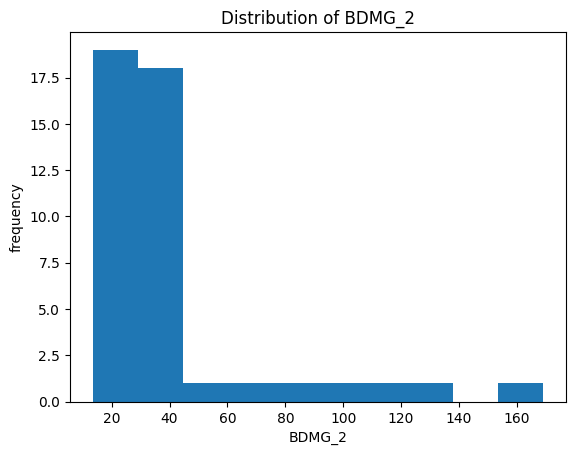

BDMG_3


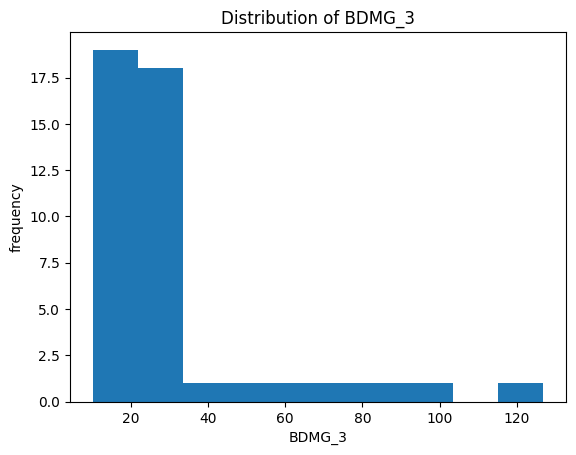

HDMG_0


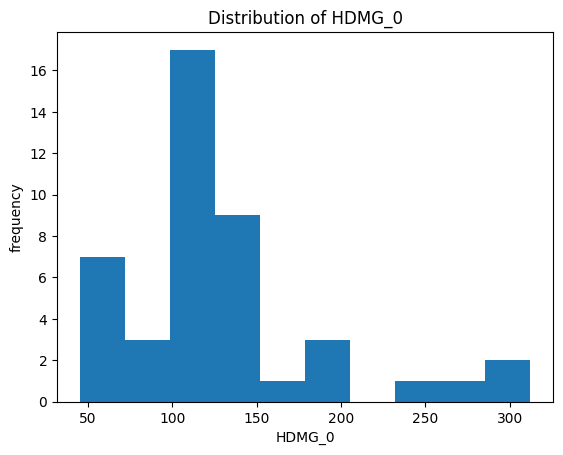

HDMG_1


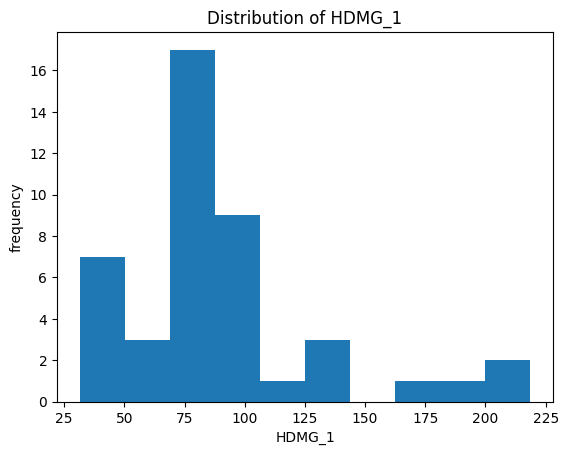

HDMG_2


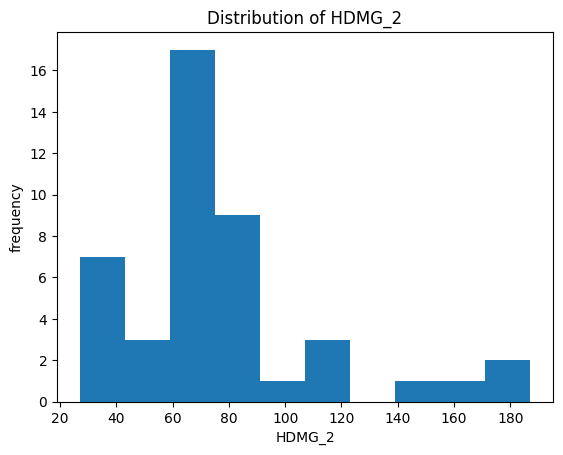

HDMG_3


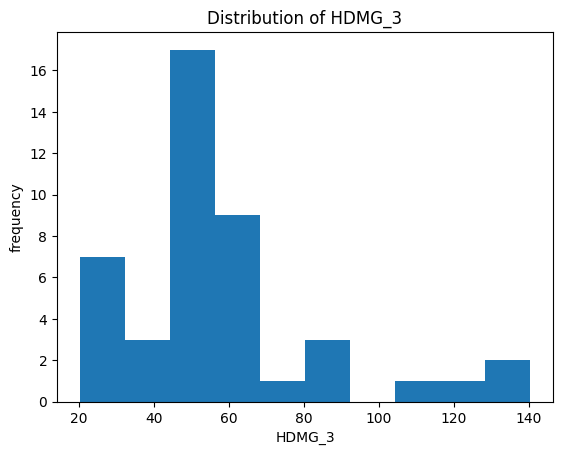

Total Body Damage


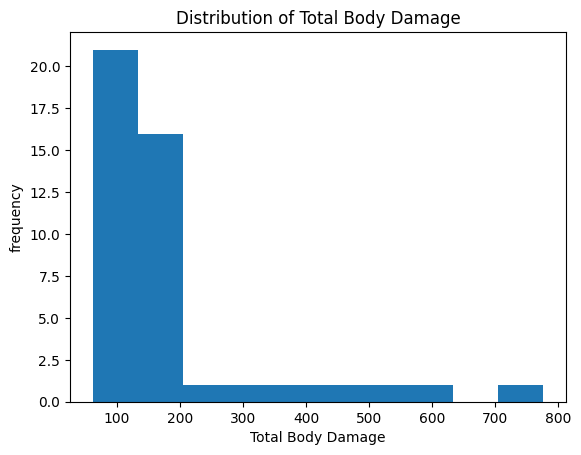

Total Head Damage


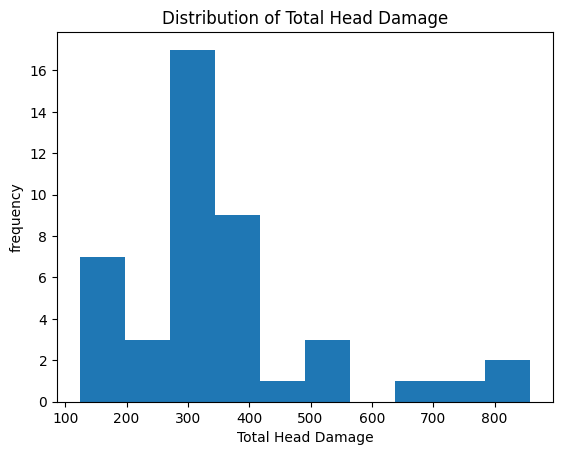

Damage per Bullet


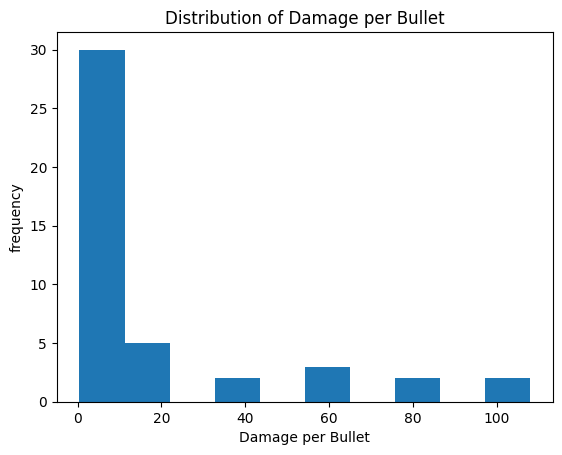

Damage per Second


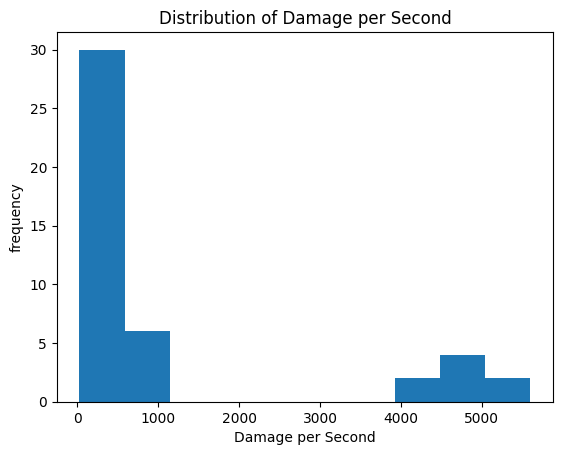

Normalized Range


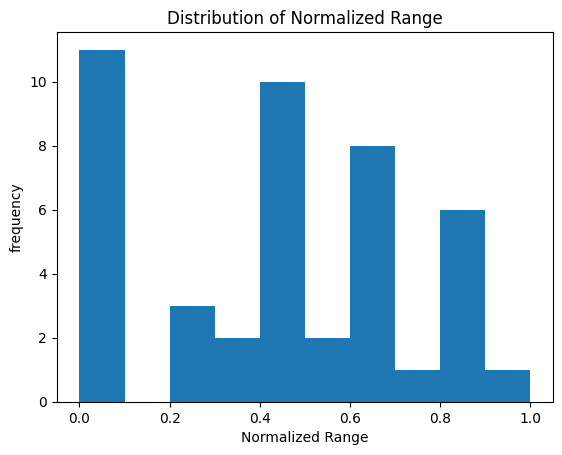

In [12]:
numerical_variables = df.select_dtypes(include=['number'])
for col in numerical_variables:
    print(col)
    plt.hist(df[col])
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('frequency')
    plt.show()

Weapon Name


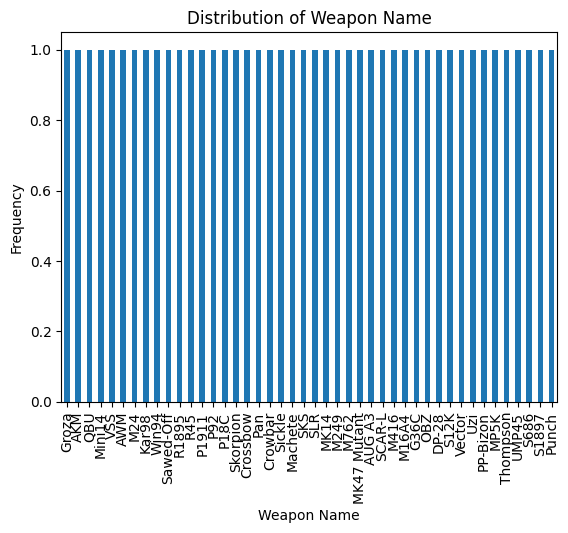

Weapon Type


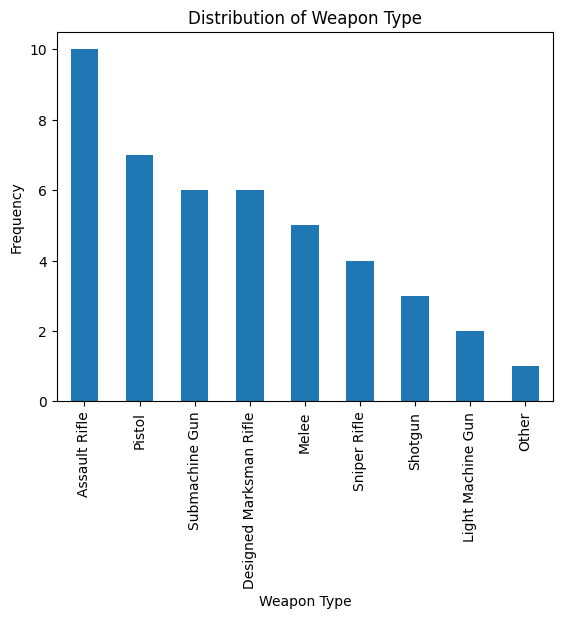

In [13]:
objective_variables = df.select_dtypes(include='object')
for column in objective_variables:
    print(column)
    df[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


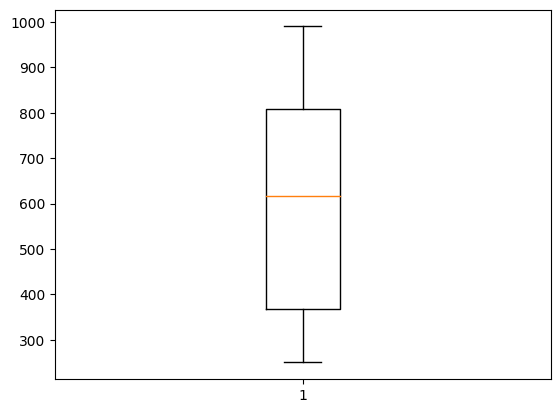

In [14]:
plt.boxplot(df['Bullet Speed'])
plt.show()


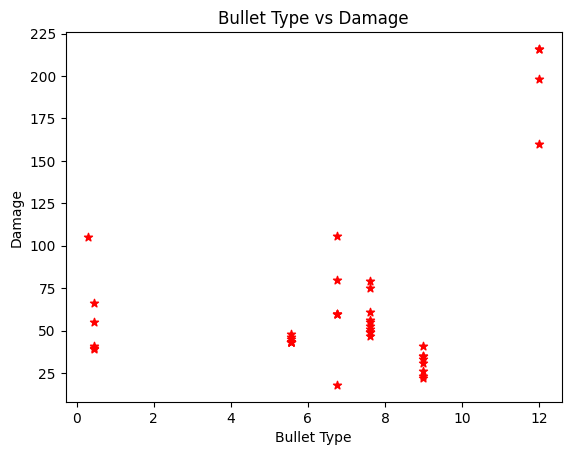

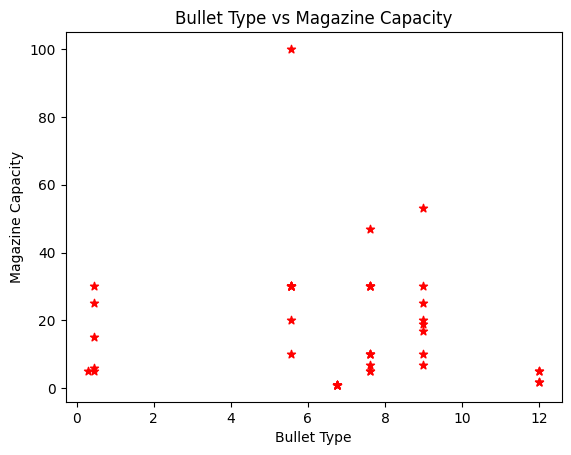

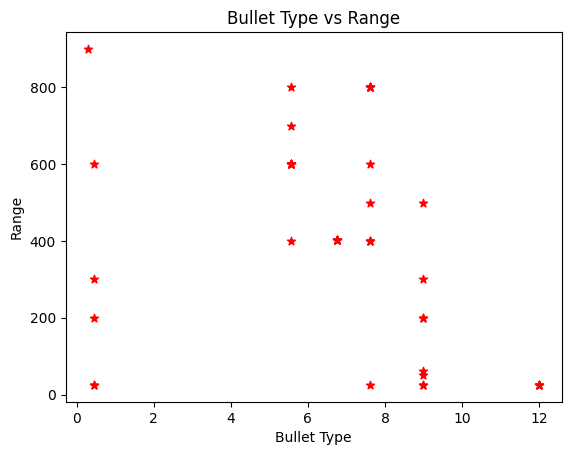

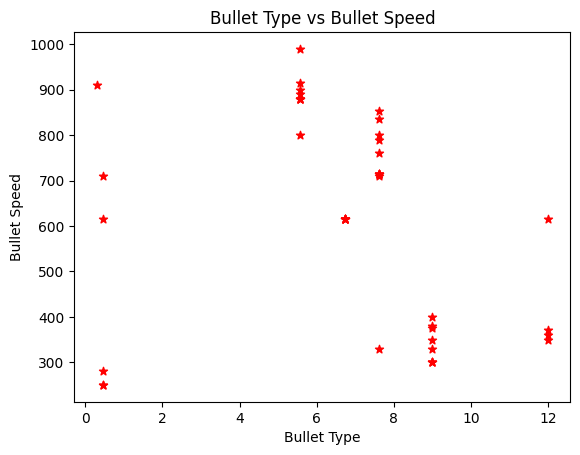

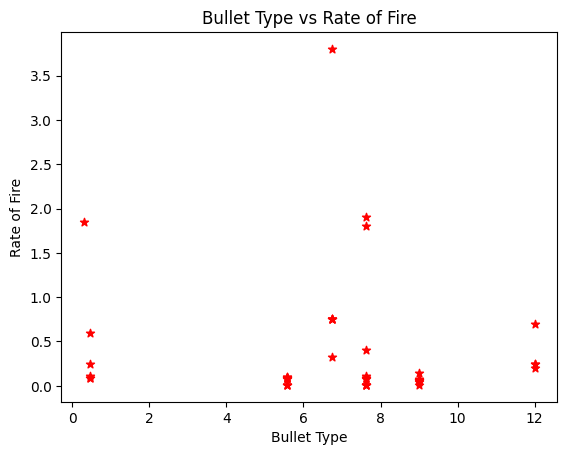

...

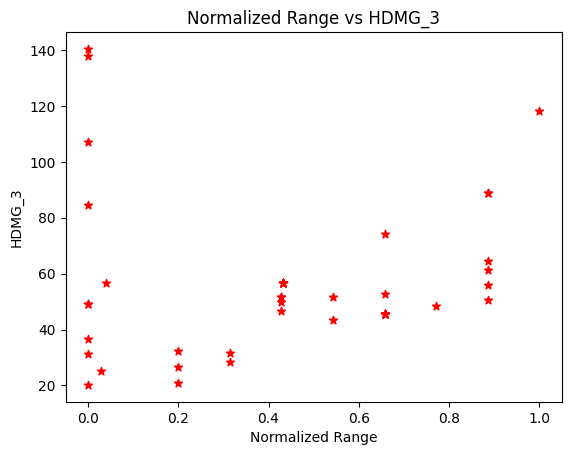

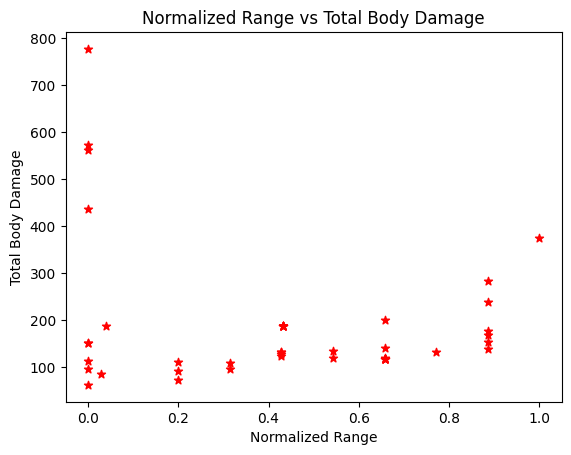

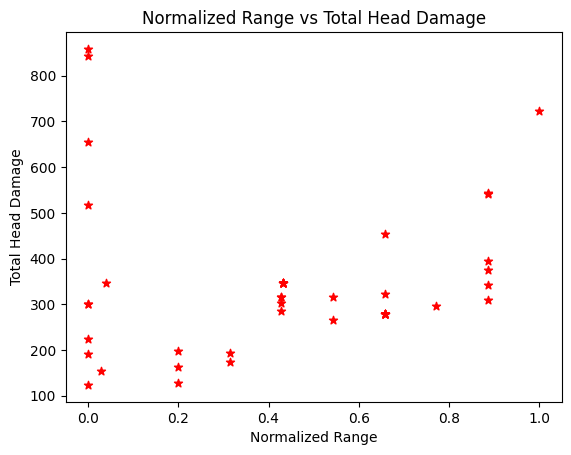

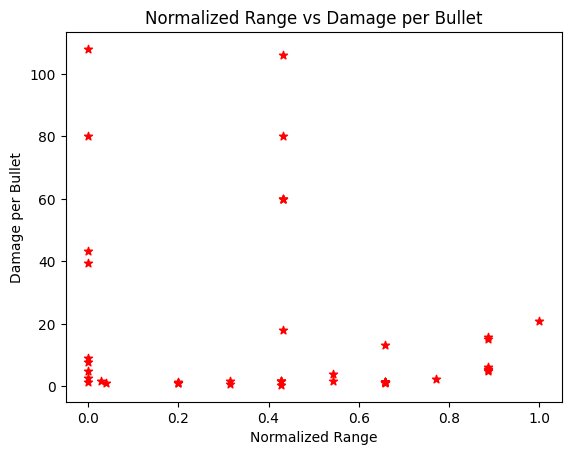

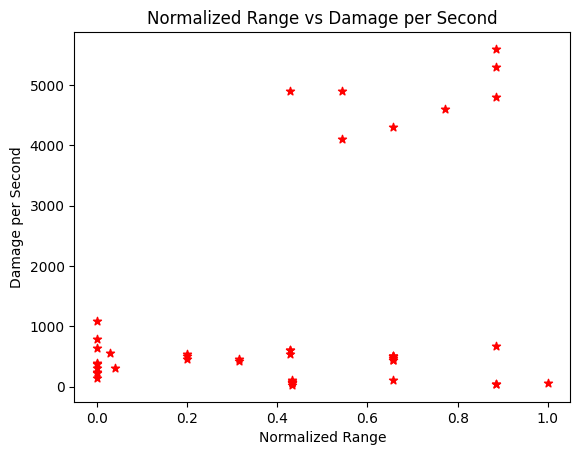

In [15]:
for column1 in numerical_variables:
    for column2 in numerical_variables:
        if column1 != column2:
            plt.scatter(df[column1], df[column2], c='red', marker="*")
            plt.title(f'{column1} vs {column2}')
            plt.xlabel(column1)
            plt.ylabel(column2)
            plt.show()

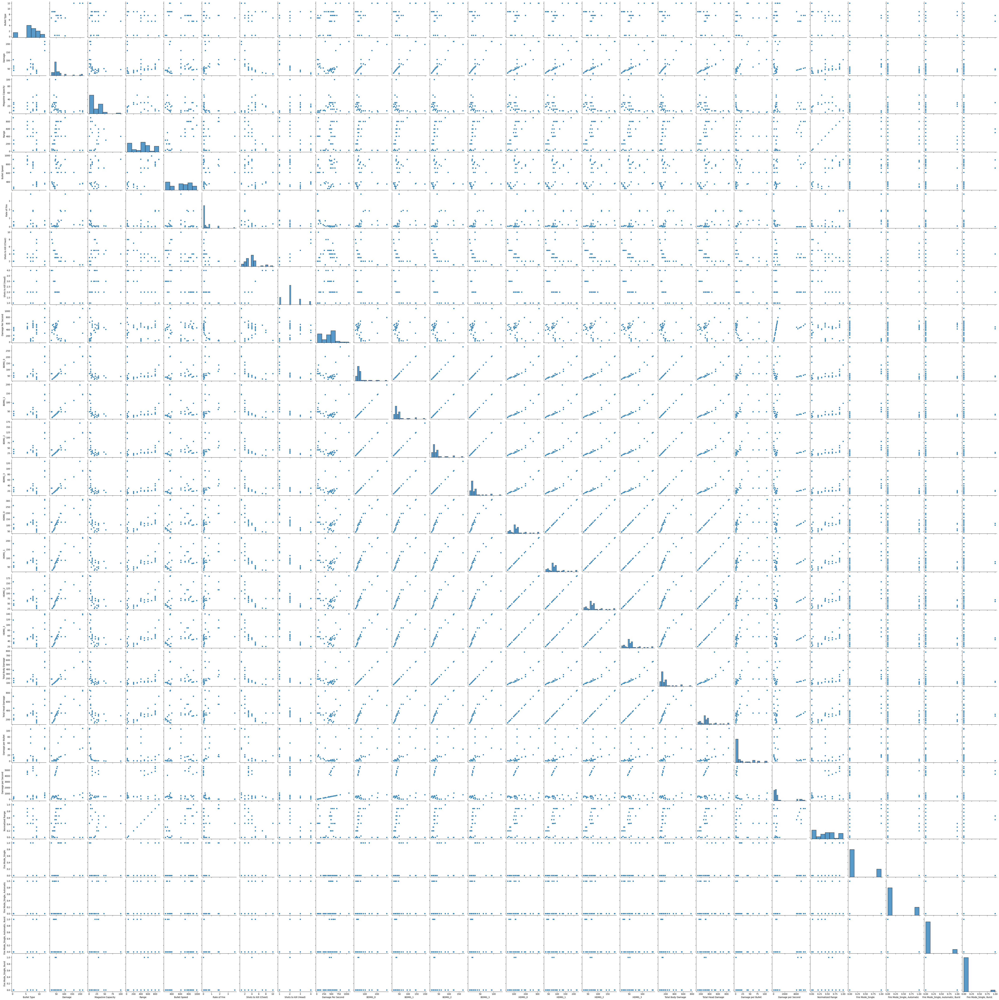

In [ ]:
sns.pairplot(df)
plt.show()

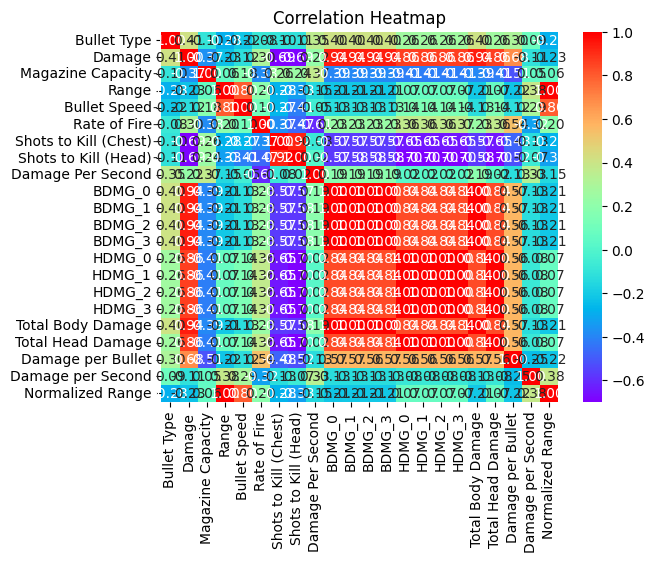

In [16]:
sns.heatmap(numerical_variables.corr(), annot=True, cmap='rainbow', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


In [17]:
# Spltting X and Y
X = df.drop('Damage', axis=1)
Y = df['Damage']


In [18]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()


In [19]:
for col in df.select_dtypes(include=['object']):
    df[col] = le.fit_transform(df[col])


In [20]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()


In [21]:
ss_x = ss.fit_transform(df.select_dtypes(include=['number']))
ss_x = pd.DataFrame(ss_x)


In [22]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(ss_x,Y, test_size=0.3, random_state=42)


In [23]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()

In [24]:
LR.fit(x_train, y_train)


LinearRegression()

In [25]:
y_pred = LR.predict(x_test)

In [26]:
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
r_square = np.sqrt(mse)


In [27]:
print('Mean Square error:', mse)
print('R2_Score:', r2)
print('R_Square:', r_square)

Mean Square error: 1.5578875933964668e-27
R2_Score: 1.0
R_Square: 3.9470084790844656e-14


In [28]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [32]:
# Define models
models = {
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'SVR': SVR(),
    'KNeighborsRegressor': KNeighborsRegressor(),
    'RandomForestRegressor': RandomForestRegressor(),
    'LinearRegression': LinearRegression(),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42)

}

results = []

# Fit and evaluate each model
for name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    r_square = np.sqrt(mse)
    results.append({"Model": name, 'MSE': mse, "r2_score": r2, "r_square": r_square})

results = pd.DataFrame(results)
print(results)


                   Model           MSE  r2_score      r_square
0  DecisionTreeRegressor  1.702857e+02  0.942031  1.304936e+01
1                    SVR  3.025880e+03 -0.030076  5.500800e+01
2    KNeighborsRegressor  7.719400e+02  0.737215  2.778381e+01
3  RandomForestRegressor  1.542083e+02  0.947504  1.241806e+01
4       LinearRegression  1.557888e-27  1.000000  3.947008e-14
5      Gradient Boosting  6.206816e+01  0.978871  7.878335e+00


<ipython-input-36-992a1fbd1893>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='r_square', data=results, palette='viridis')


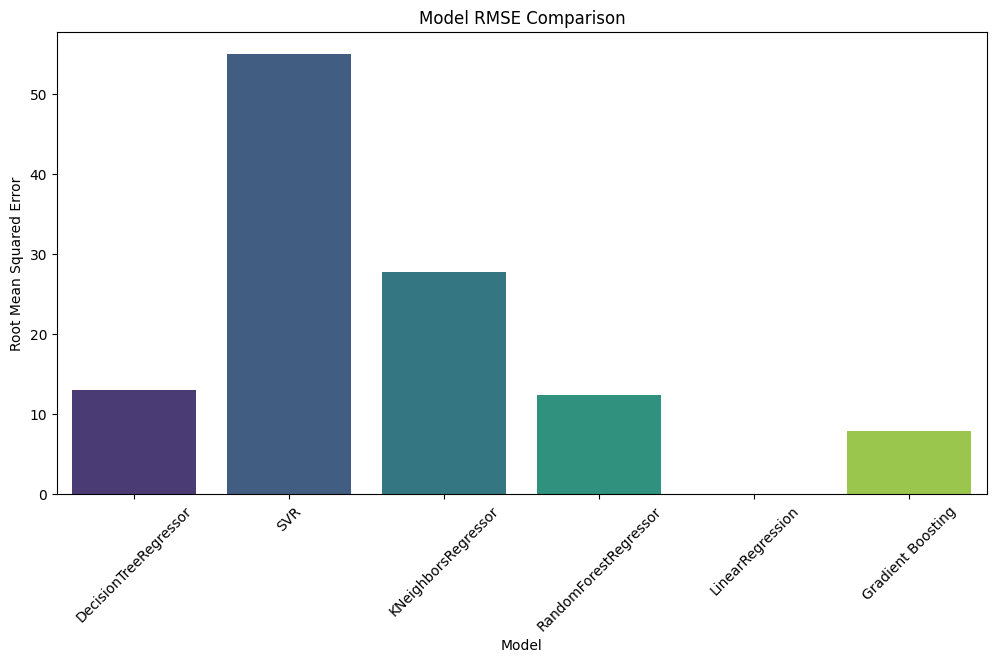

In [36]:
# Plot the results
plt.figure(figsize=(12, 6))
sns.barplot(x='Model', y='r_square', data=results, palette='viridis')
plt.title('Model RMSE Comparison')
plt.ylabel('Root Mean Squared Error')
plt.xticks(rotation=45)
plt.show()

<ipython-input-40-a429284c40ca>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='r_square', data=results, palette='coolwarm')


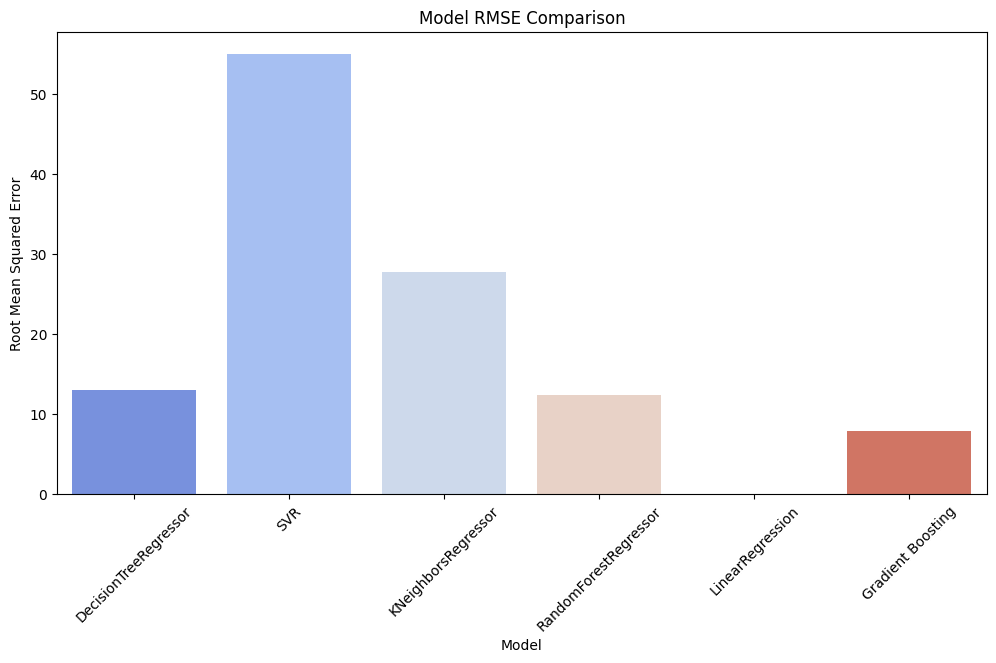

In [40]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Model', y='r_square', data=results, palette='coolwarm')
plt.title('Model RMSE Comparison')
plt.ylabel('Root Mean Squared Error')
plt.xticks(rotation=45)
plt.show()

In [45]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 5.9 MB/s eta 0:00:00


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] Start training from score 61.900000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

<Figure size 1600x1000 with 0 Axes>

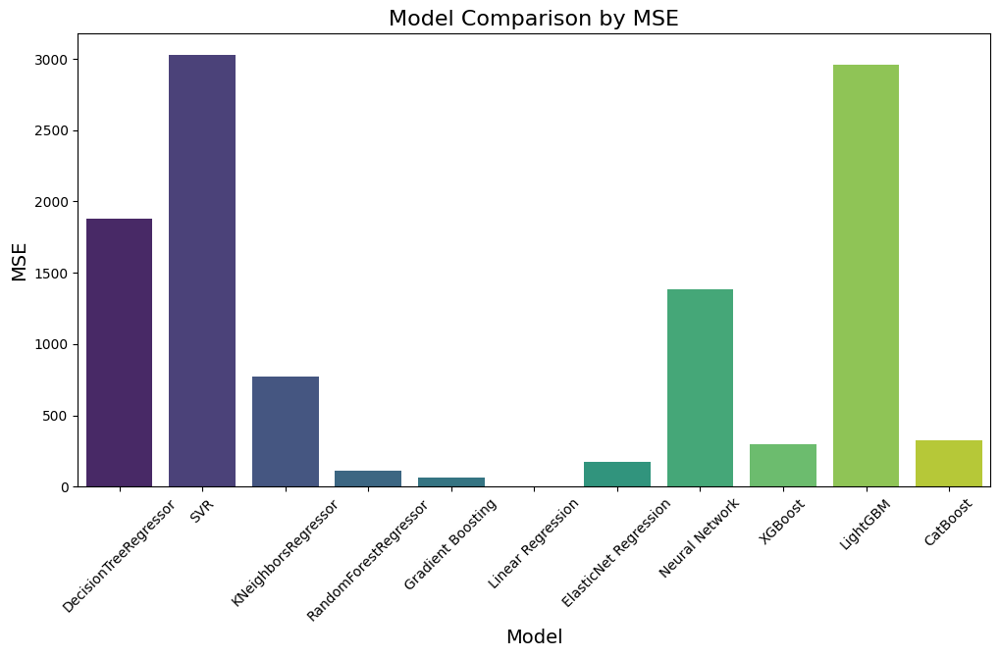

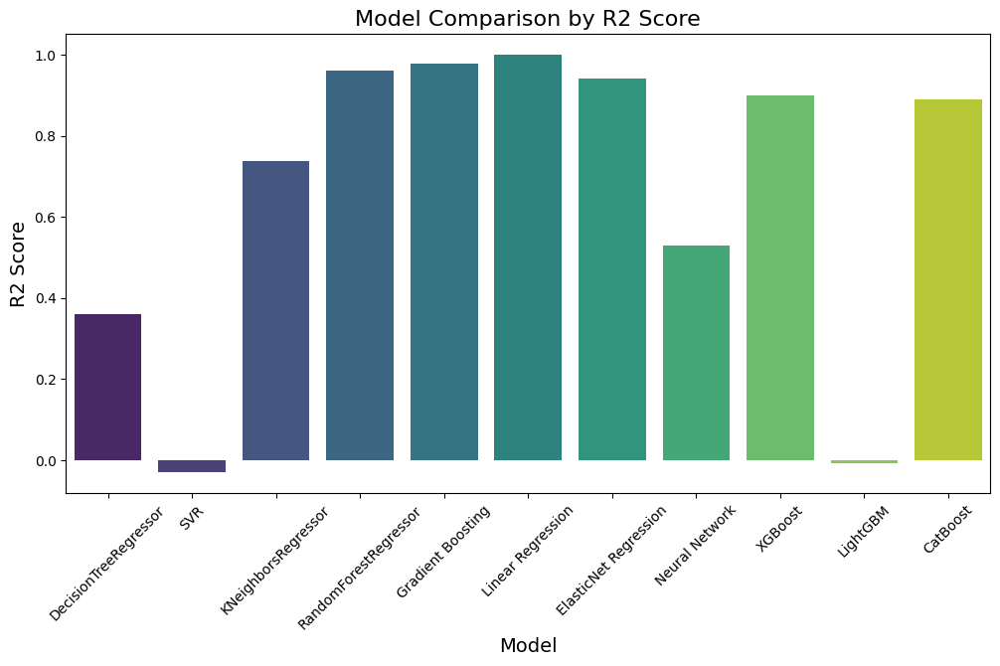

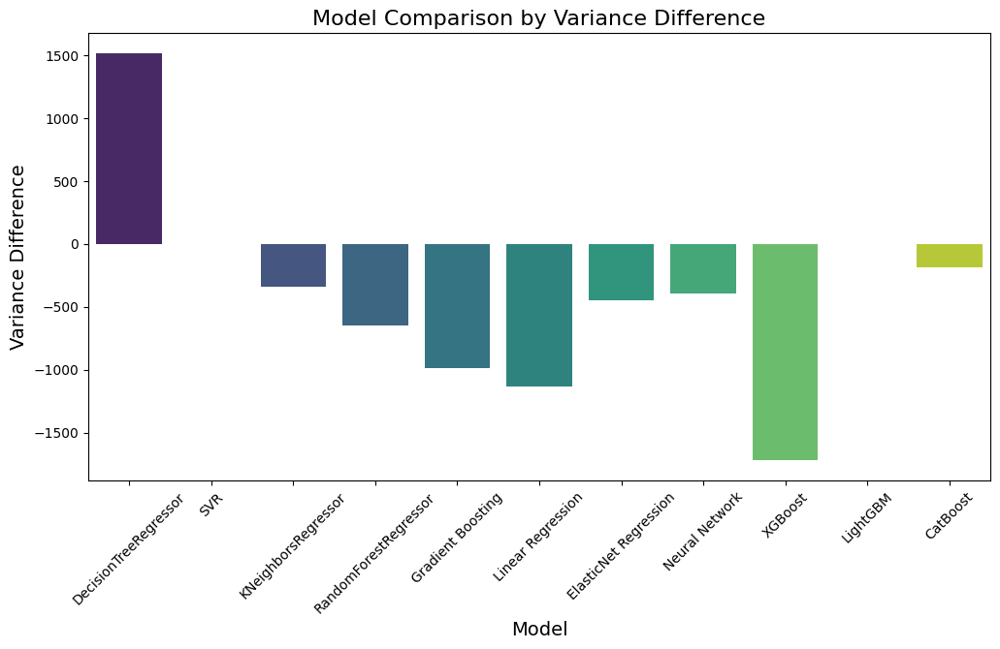

In [49]:
from sklearn.linear_model import ElasticNet
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
# Define models
models = {
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'SVR': SVR(),
    'KNeighborsRegressor': KNeighborsRegressor(),
    'RandomForestRegressor': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'Linear Regression': LinearRegression(),
    'ElasticNet Regression': ElasticNet(),
    'Neural Network': MLPRegressor(random_state=42),
    'XGBoost': XGBRegressor(),
    'LightGBM': LGBMRegressor(),
    'CatBoost': CatBoostRegressor(verbose=0),


}

results = []

# Fit and evaluate each model
for name, model in models.items():
    model.fit(x_train, y_train)
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)
    mse = mean_squared_error(y_test, y_test_pred)
    r2 = r2_score(y_test, y_test_pred)
    r_square = np.sqrt(mse)
    train_variance = np.var(y_train_pred)
    test_variance = np.var(y_test_pred)
    variance_diff = train_variance - test_variance
    results.append({
        "Model": name,
        'MSE': mse,
        "R2 Score": r2,
        "R Square": r_square,
        "Train Variance": train_variance,
        "Test Variance": test_variance,
        "Variance Difference": variance_diff
    })

results_df = pd.DataFrame(results)

# Plotting
plt.figure(figsize=(16, 10))
palette = sns.color_palette("viridis", len(results_df))

metrics = ['MSE', 'R2 Score', 'Variance Difference']
for metric in metrics:
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Model', y=metric, data=results_df, palette=palette)
    plt.title(f'Model Comparison by {metric}', fontsize=16)
    plt.xticks(rotation=45)
    plt.ylabel(metric, fontsize=14)
    plt.xlabel('Model', fontsize=14)
    plt.show()
